In [1]:
import os
import sys
import time
from datetime import date
from datetime import datetime
import time
import json
import platform
import requests

import project

from sklearn import linear_model
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from math import sqrt

# //*** Imports and Load Data
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

#//*** Use the whole window in the IPYNB editor
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))
subreddits = ["wallstreetbets", "stocks", "wallstreetbetsOGs", "spacs", "investing", "pennystocks", "stockmarket", "options", "robinhoodpennystocks", "wallstreetbetsnew", "smallstreetbets"]
filepath = "./data/"
filename_suffix = "_comments.csv.zip"
#//*** Maximize columns and rows displayed by pandas
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 100)


f = open("./ignore_folder/alpha_vantage_api.json", "r")

#//*** Fugley Pythonic type conversion
#//*** Loads the file into Dictionary via JSON.loads
#//*** Gets the API key value using the 'api' key
#//*** prepends apikey= so the resulting value is URL ready :]
av_apikey = json.loads(f.read())['apikey']
f.close()


In [4]:
import project
symbols = ['dog','dis','wish','msft','aapl','gm','pe','nok','ba','psa']

symbols = ['ltc','bsv','bch','eth']
symbols = ['dis','sabr','rkt','ibkr','AAPL','MSFT','ATOS','SPY','NVCN','CTXR','ACST','DNN','AMD','SPRT','TDA','SENS','IMTE','GSAT','GNUS','AL','XELA','ZOM','WPRT','WHLR','TY','TTOO','TNXP','TBLT','SWI','SQBG','SNMP','RS','TSLA','RGLS','POWW','OIL','OI','OCGN','NRBO','NOC','NET','MVIS','MU','MSM','MRNA','MMT','MIK','METX','LODE','LMT','IQ','HGEN','GORO','GL','GE','FUV','FSR','CORT','CLOV','CFMS','CEI','BYSI','BTG','BNGO','BLNK','AUMN','ATVI','ASRT','AMC','ASM','FAMI','CRTD','PT']
#symbols = ['dis','aapl','RKT','SABR']
symbols = ['sabr']
#symbols = ['doge']
action = 'daily'

#//**** Get all Stocks to Model

#//*** Define the interval to working in. This model is built around daily stock information
#//*** could be adjusted to difeeren
interval="daily"

training_days = 30
train_start_slice = 0
train_end_slice = training_days

predict_col = [f'target_1']
#//*** Path to processed files

#//*** Path to the stock ticker JSON file
stock_ticker_filename = "./data/stock_tickers.json"

months_to_model = 6

symbols = [x.lower() for x in symbols]

#//*** Values to use for Simple Move Averages
sma_cols = [10]

sma_col_names = []

for x in sma_cols:
    sma_col_names.append(f'sma_{x}')

print(sma_col_names)


#//*** Values to use for Exponential Moving Averages
ema_cols = [5,10]
ema_cols = [5]

ema_col_names = []

for x in ema_cols:
    ema_col_names.append(f'ema_{x}')

print(ema_col_names)
passthru_cols = sma_col_names + ema_col_names
print(passthru_cols)


#//*** Multiple models can be run simultaneously for comparison. The output can get cluttered quite quickly
training_cols = {
    #'model_02' : ['close',"isma_10",'volume','open','high','low',"ema_5"],
    'model_01' : ['close','volume','open','high','low'],
}

model_cols = training_cols.keys()

predict_df_cols = ['symbol','time','actual','predict']

#//*** Dataframe to hold the predictions
predict_df = pd.DataFrame(columns=predict_df_cols)

d_col = ['time', 'symbol','close','target_1']

#//*** Process Stocks, Generate Predictions, Save Predictions to a file

#//*** Build the stock data and generate predictions using Future Overfitting Ensemble. 
print(predict_df)
print(symbols)
print(training_cols)

#//**** Process Each Symbol
for symbol in symbols:
    
    #//**** BEGIN Downloading symbol
    start_symbol_time = time.time()
    
    if (action == '1min') or (action == '60min'):
           
        #//*** initialize output dataframe
        out_df = pd.DataFrame()
            
        #//*** Loop the year
        for year in [1,2]:

            #//*** Loop each month
            for month in range(1,13):
                print(f"Length out_df: {len(out_df)}")
                print(f"Building URL: {symbol} - Month {month} Year {year}")
                url = build_url(action,symbol,month,year)

                print("Downloading")
                print(url)
                r = requests.get(url)
                print(r.text[:1000])
                f = open("t.csv", "w")

                f.write(r.text)
                f.close()

                out_df = pd.concat([out_df,pd.read_csv("t.csv")])

                print("Waiting 20 Seconds")
                time.sleep(20)

                    
        print("df Built")
        print(out_df.head(10))

        output_filename = f"./stocks/{symbol}_{action}.csv.zip"

        #//*** Convert Path to Mac formatting if needed
        #if platform.system() == 'Darwin':
            #output_filename = output_filename.replace("\\","/")

        print(f"Writing dataframe to File: {output_filename}")
        out_df.to_csv(output_filename,compression="zip",index=False)
    if action == 'daily':
        
        #//*** initialize output dataframe
        out_df = pd.DataFrame()
         
        print(f"Building URL: {symbol}")
        url = project.build_url(action,symbol)    
        
        print("Downloading")
        print(url)
        r = requests.get(url)
                    #print(year,month)
            #print("Waiting 20 Seconds")
            #time.sleep(20)

            #//*** Build the Url Request for each symbol
    #//*** Verify we built a proper url
#    if url != None:
        
#        print("Downloading....")
        #//*** Download the data for each Symbol
#        r = requests.get(url)


        #//*** Convert raw string to dictionary for processing 
        data = r.json()

        #//*** Get the Key value that contains the list of dates
        data_key = list(data.keys())[1]

        #//*** Output Dictionary
        out_dict = {}
        print("Processing....")
        #//*** Process Data into the out_dict
        for date in data[data_key]:
            #//*** Build out_dict (output_dictionary) keys 
            if len(out_dict.keys()) == 0:
                out_dict['date'] = []
                out_dict['symbol'] = []

                #//*** Get this dictionary for the first row. Use the key values, but strip the first 3 characters which are numeric
                for key in data[data_key][date].keys():
                    out_dict[key[3:]] = []

            #//*** Add Date to out_dict
            out_dict['date'].append(date)

            #//*** Add Symbol to out_dict
            out_dict['symbol'].append(symbol)

            #//*** Loop through the daily values and append to the out_dict
            for key,value in data[data_key][date].items():

                #//*** Trim first 3 characters off key and append to the appropriate dictionary list
                out_dict[key[3:]].append(value)

        print("Building Dataframe")
        out_df = pd.DataFrame()
        #//*** Convert the Dictionary to a Dataframe
        #//*** Each Key is a column, the data is the list
        for key,value in out_dict.items():
            out_df[key] = value

        #//*** Generic Filename - Placeholder
        output_filename = f".\\stocks\\{symbol}_need_a_better_name.csv.zip"
        
        
        #//*** Build filename based on action type
        if action == 'daily':
            output_filename = f".\\stocks\\{symbol}_daily.csv.zip"
        
        if action == '1min':
            output_filename = f".\\stocks\\{symbol}_1min.csv.zip"

        #//*** Convert Path to Mac formatting if needed
        if platform.system() == 'Darwin':
            output_filename = output_filename.replace("\\","/")
        
        print(f"Writing dataframe to File: {output_filename}")
        out_df.to_csv(output_filename,compression="zip",index=False)    
    #//**************************************************************************************************************************
    #//**************************************************************************************************************************
    #//**** Download Complete
    #//**************************************************************************************************************************
    #//**************************************************************************************************************************

    #//*** Build predict_df. Now holds individual stocks
    predict_df_cols = ['symbol','time','actual','predict']

    #//*** Dataframe to hold the predictions
    predict_df = pd.DataFrame(columns=predict_df_cols)

    #print("==========")
    #print("==========")
    #print("==========")
    print(f"Building {symbol} Targets...")
    #//*** Build stock price and target columns to predict
    model_df = project.build_stocks(symbol,'daily',[1])  

    #//*** Generate some Simple Moving Averages
    for x in sma_cols:
        model_df[f"sma_{x}"] = model_df['close'].rolling(window=x).mean()
        
        model_df[f"isma_{x}"] = project.build_inverted_curve(model_df['close'],model_df[f"sma_{x}"]).rolling(window=x).mean()
        
        if f"isma_{x}" not in passthru_cols:
            passthru_cols.append(f"isma_{x}")
            
    for x in ema_cols:
        model_df[f"ema_{x}"] = project.calculate_ema(model_df['close'],x)
        
    
    #//*** Remove Stock Prices older than 6 months
    model_df = model_df[ model_df['time'] >= model_df['time'].max()-pd.DateOffset(months=months_to_model) ]
    
   
    #//*** Generate each Future Overfit prediction
    for row_int in range(0,len(model_df)-training_days-1):
        
        #//*** Build the slice start index
        start_dex = train_start_slice+row_int
        start_dex = 0
        #//*** Build the slice end index
        end_dex = train_end_slice+row_int

        #dc = f"{start_dex}/{len(model_df)}"
        
        #//*** Build the sliced training df
        train_df = model_df[start_dex:end_dex].copy()
        train_df.reset_index(inplace=True,drop=True) 
        
        #//*** Build the row index on the prediction (train_end_slice+1)
        predict_dex = row_int+train_end_slice+1

        
        #//*** Have a place to store the last results. This will be used to generate the final prediction in the series
        last_results = {}
        
        #//*** Add results to list will add to predict_df
        #//*** These are fixed values
        out_predict = [symbol,model_df.iloc[end_dex]['time'],model_df.iloc[end_dex]['close'],np.array(model_df[predict_col].iloc[end_dex],)[0]]
        
        #//*** Run prediction on each set of model values in training_cols
        #//*** Model Cols is list(training_cols.keys())
        for col in model_cols:
            
            loop_train_cols = training_cols[col]
        
            x_train = np.array(train_df[loop_train_cols])
        
            y_train = np.array(train_df[predict_col].values.ravel())

            #//*** Grabs a single item from the Datframe, which returns a series.
            #//*** Transpose() gets it into the proper 2-D format
            x_test = pd.DataFrame(model_df.iloc[end_dex+1].copy()).transpose()[loop_train_cols]
        
            y_test = np.array(model_df[predict_col].iloc[end_dex],)[0]
            
            
            # Create linear regression object
            linear_regr_stock = linear_model.LinearRegression()

            # Train the model using the training sets
            linear_regr_stock.fit(x_train, y_train)
            linear_result_stock = linear_regr_stock.predict(x_test)
            
            #//*** Store the last result, Only the final calculation will be kept
            last_results[col] = linear_regr_stock.predict(np.array(model_df.iloc[-1][loop_train_cols]).reshape(1, -1))[0]
        
            
            #//*** Add the Model Results
            #//*** Add Model COlumn if it doesn't exist
            if col not in list(predict_df.columns):
                predict_df[col] = []
                
            out_predict.append(linear_result_stock[0])
            
        
        
        
        #//*** Add the passthru values to the predictions
        for col in passthru_cols:
            
            #//*** Add Columns if needed
            if col not in list(predict_df.columns):
                predict_df[col] = []
                
            out_predict.append(model_df.iloc[end_dex][col])
        
        #//*** Add the Predictions to the last line of the the dataframe
        predict_df.loc[len(predict_df)] = out_predict
        
    
    #//*** END EACH Prediction
    
    #//*** Very Last Day Prediction I should be able to fold this into the above prediction loop. But I don't
    #//*** for some reason that I need to investigate
    out_predict = [symbol,model_df.iloc[-1]['time'],model_df.iloc[-1]['close'],model_df.iloc[-1]['close']]
    
    for col in model_cols:

        out_predict.append(last_results[col])
    
    
    #//*** Add the passthru columns (SMA & EMA) to be used in plotting.
    for col in passthru_cols:
        out_predict.append(model_df.iloc[-1][col])
    
    #print("Out Predict ",out_predict)
    #print("Predict_df: ", predict_df)
    predict_df.loc[len(predict_df)] = out_predict
    
    #if len(predict_df) > 5:
    #    break
    
    print(f"Writing {symbol} to file: ./rotor/{symbol}_{interval}.csv")
    predict_df.to_csv(f"./rotor/{symbol}_{interval}.csv",index=False)

    #//**************************************************************************************************************************
    #//**************************************************************************************************************************
    #//**** If it's less than 20 seconds to process the Model. Wait till 20 seconds has elapsed to download next file
    #//**************************************************************************************************************************
    #//**************************************************************************************************************************
    while (time.time() - start_symbol_time < 20):
        print(f"Waiting: {round(20 - (time.time() - start_symbol_time) ,2)}s")
    
        time.sleep(1)

print("done")


['sma_10']
['ema_5']
['sma_10', 'ema_5']
Empty DataFrame
Columns: [symbol, time, actual, predict]
Index: []
['sabr']
{'model_01': ['close', 'volume', 'open', 'high', 'low']}
Building URL: sabr
sabr daily
Downloading
https://www.alphavantage.co/query?function=TIME_SERIES_DAILY&symbol=sabr&outputsize=full&apikey=S4DI5C1JRKCLIM74
Processing....
Building Dataframe
Writing dataframe to File: .\stocks\sabr_daily.csv.zip
Building sabr Targets...
Writing sabr to file: ./rotor/sabr_daily.csv
Waiting: 17.64s
Waiting: 16.64s
Waiting: 15.64s
Waiting: 14.64s
Waiting: 13.64s
Waiting: 12.64s
Waiting: 11.64s
Waiting: 10.64s
Waiting: 9.64s
Waiting: 8.64s
Waiting: 7.64s
Waiting: 6.64s
Waiting: 5.64s
Waiting: 4.64s
Waiting: 3.64s
Waiting: 2.64s
Waiting: 1.64s
Waiting: 0.64s
done


In [4]:
def plot_profit_loss(loop_df,model_cols,thresholds,small_text=30,symbol_size=100):
   
    from project import calc_results
    fig,ax = plt.subplots()

    fig.set_figheight(20)
    fig.set_figwidth(60)
    
    ax.hlines(0,loop_df['time'].min(),loop_df['time'].max(),color="black",linewidth=10)
    
    
    #//*** Build Model Actions for each Threshold Value
    #//*** The Column name is the base with the action Threshold appended
    for thresh in thresholds:
        loop_col = f'action_{int(thresh*100)}'
        #//*** Plot the PL chart
        ax.plot(loop_df['time'],calc_results(loop_df,"pl",actual='actual',model = loop_col,get_list=True),linewidth=1,label=f"P/L - Perfect Thresh {thresh}%" )
        
    
    for col in model_cols:
        for thresh in thresholds:
            #//*** Model Column name
            loop_col = f'{col}_action_{int(thresh*100)}'
            
            #//*** Plot the PL chart
            ax.plot(loop_df['time'],project.calc_results(loop_df,"pl",actual='actual',model = loop_col,get_list=True),linewidth=5,label=f"Threshold {thresh} - {col}" )
    
    ax.hlines(0,loop_df['time'].min(),loop_df['time'].max(),color="black",linewidth=10)
    plt.title(f"{group[0]}\n Estimated Profit/Loss Over Time",fontsize=50)
    
    plt.xticks(fontsize=small_text)
    plt.yticks(fontsize=small_text)
    plt.legend(fontsize=small_text)
    plt.show()


def plot_history(loop_df,passthru_cols,small_text=30,symbol_size=100):
    from project import calc_results

    
    loop_df = loop_df.copy()
    fig,ax = plt.subplots()

    fig.set_figheight(20)
    fig.set_figwidth(60)


    #//*****************************************************************
    #//*** Plot the thresholded Buy Sell Bars based
    #//*** Only Draw Bars Where there is a clear Buy/Sell Signal
    #//*****************************************************************
    
    base_thresh_height =  (len(threshold_cols)*2) 
    base_thresh_width = 1

    #//*** Plot the Optimal Threshold Buy Sell Lines
    for thresh_col in threshold_cols:
        trans = .2
        for x in range(0,len(loop_df)):
            if loop_df.iloc[x][thresh_col] == -1:
                plt.vlines(loop_df.iloc[x]['time'],loop_df.iloc[x]['actual']-base_thresh_height,loop_df.iloc[x]['actual'],linewidth=base_thresh_width,alpha=trans)
            elif loop_df.iloc[x][thresh_col] == 1:
                plt.vlines(loop_df.iloc[x]['time'],loop_df.iloc[x]['actual'],loop_df.iloc[x]['actual']+base_thresh_height,linewidth=base_thresh_width,alpha=trans)
        
        #//*** Thresh_Col Drawn, Adjust Line Heights. Future cols get shorter and fatter
        base_thresh_width += 4
        base_thresh_height -= 2

    #//*** Plot the Actual Price
    ax.plot(loop_df['time'],loop_df['actual'],label='actual',color='red',linewidth=3 )
    
    plot_df = loop_df.copy()
    plot_df['model_01_action_0'] = plot_df['model_01_action_0'].replace(-1,np.nan)
    
    #//*** Plot the modeled Threshold Actions
    
    #//*** For Each Model Column
    for col in model_cols:
        
        base_thresh_height = (len(threshold_cols)*2) 

        #//*** Build Model Actions for each Threshold Value
        #//*** The Column name is the base with the action Threshold appended
        for thresh in thresholds:
            loop_col = f'{col}_action_{int(thresh*100)}'
            
            #//*** Plot Positive values
            plot_df = loop_df.copy()
            plot_df[loop_col] = plot_df[loop_col].replace(-1,np.nan)
            ax.scatter(plot_df['time'], (plot_df[loop_col]*base_thresh_height)+loop_df['actual'],s=symbol_size,color='red',marker="^" )
            
            #//*** Plot Negative values
            plot_df = loop_df.copy()
            plot_df[loop_col] = plot_df[loop_col].replace(1,np.nan)
            ax.scatter(plot_df['time'], (plot_df[loop_col]*base_thresh_height)+loop_df['actual'],s=symbol_size,color='red',marker="v" )

            #//*** Get a series representing the simple accuracy of each prediction.
            #//*** 1 = Accurate
            #//*** 0 = Fail
            
            
            plot_df = loop_df.copy()
            
            #//*** Multiply the Model Action by the inverted accuracy. 0 is success, 1 = fail
            #//*** This keeps the values to cover
            plot_df['temp'] =  abs(calc_results(loop_df,"accuracy",actual=f'action_{int(thresh*100)}',predict=loop_col)-1).replace(0,np.nan)*plot_df[loop_col]
            ax.scatter(plot_df['time'], (plot_df['temp']*base_thresh_height)+loop_df['actual'],s=symbol_size,color='black',marker="x" )

    
            base_thresh_height -= 2
    
        #//*** Only show accuracy of the first model
        break
    
    #//*** Plot Passthru Columns
    for col in passthru_cols:
        ax.plot(loop_df['time'],loop_df[col],label=col)

    title = ""
    
    
    title+="\n\n"
    
    #print(loop_df)
    for col in model_cols:
        
        base_thresh_height = (len(threshold_cols)*2) 
        
        
        title += f'{col}: r2: {calc_results(loop_df,"r2",actual="actual",predict=col)} <rmse: {calc_results(loop_df,"rmse",actual="actual",predict=col)}> (mae: {calc_results(loop_df,"mae",actual="actual",predict=col)})\n'
        #//*** Build Model Actions for each Threshold Value
        #//*** The Column name is the base with the action Threshold appended
        for thresh in thresholds:
            loop_col = f'{col}_action_{int(thresh*100)}'
            acc = round(calc_results(loop_df,"accuracy",actual=f"action_{int(thresh*100)}",predict=loop_col,verbose=False).sum()/len(loop_df),2)
            loop_pl = calc_results(loop_df,"pl",actual="actual",model = loop_col,verbose=False)
            
            
            title += f'{col}: Thresh {int(thresh*100)}% Acc: {acc} -- pl {loop_pl} [Modeled Return: {(round(loop_pl/(loop_df["actual"].iloc[0]),2))*100}%]\n'
            actual_value = loop_df.iloc[-1]['actual']
            model_prediction = round(loop_df.iloc[-1][col],2)
            
            predicted_change = round(1-(actual_value /  model_prediction ),4) 
            
            predicted_action = loop_df.iloc[-1][f'{col}_action_{int(thresh*100)}']
            
            if predicted_action == 1:
                predicted_action = "BUY"
            elif predicted_action == 0:
                predicted_action = "HOLD"
            elif predicted_action == -1:
                predicted_action = "SELL"
                
                
            
            title += f"{loop_df.iloc[-1]['time']} Close: {actual_value} Predict: {model_prediction} Recommend: {predicted_action} Change: ${round(model_prediction - actual_value,4)} [{round(predicted_change*100,4)}%]\n"

        #tomorrow_date = (loop_df.iloc[-1]['time'] + pd.DateOffset(days=1)).date()
        #tomorrow_price = round(loop_df.iloc[-1]['predict'],2)
        #threshold_01 = abs((loop_df.iloc[-1]['actual'])*.01)
        #threshold_05 = abs((loop_df.iloc[-1]['actual'])*.05)
        #tomorrow_price_change = abs(loop_df.iloc[-1]['actual']-tomorrow_price)

        #recommend_01 = "ACTION?"
        #recommend_05 = "ACTION?"

        #if tomorrow_price_change < threshold_01:
        #    recommend_01 = "HOLD"
        #elif loop_df.iloc[-1]['actual'] < tomorrow_price:
        #        recommend_01 = "BUY"         
        #else:
        #    recommend_01 = "SELL"         



        #if tomorrow_price_change < threshold_05:
        #    recommend_05 = "HOLD"

        #elif loop_df.iloc[-1]['actual'] < tomorrow_price:
        #        recommend_05 = "BUY"         
        #else:
        #    recommend_05 = "SELL"         

        title+="\n"

    
    title += f"Initial Cost: {(loop_df['actual'].iloc[0])}"
      
    #//*** Suptitle needs to be positioned above the title. The position (y Value)
    plt.suptitle(f"{group[0]}",fontsize=50,y=1+(title.count("\n")*.018))
    plt.title(title,fontsize=small_text)
    plt.xticks(fontsize=small_text)
    plt.yticks(fontsize=small_text)
    plt.legend(fontsize=small_text)
    plt.show()



    

['dis', 'sabr', 'rkt', 'ibkr', 'AAPL', 'MSFT', 'ATOS', 'SPY', 'NVCN', 'CTXR', 'ACST', 'DNN', 'AMD', 'SPRT', 'TDA', 'SENS', 'IMTE', 'GSAT', 'GNUS', 'AL', 'XELA', 'ZOM', 'WPRT', 'WHLR', 'TY', 'TTOO', 'TNXP', 'TBLT', 'SWI', 'SQBG', 'SNMP', 'RS', 'TSLA', 'RGLS', 'POWW', 'OIL', 'OI', 'OCGN', 'NRBO', 'NOC', 'NET', 'MVIS', 'MU', 'MSM', 'MRNA', 'MMT', 'MIK', 'METX', 'LODE', 'LMT', 'IQ', 'HGEN', 'GORO', 'GL', 'GE', 'FUV', 'FSR', 'CORT', 'CLOV', 'CFMS', 'CEI', 'BYSI', 'BTG', 'BNGO', 'BLNK', 'AUMN', 'ATVI', 'ASRT', 'AMC', 'ASM', 'FAMI', 'CRTD', 'PT']
   symbol       time  actual    model_01 signal_0  change_0  diff_0
95   aapl 2021-08-09  146.09  146.023079     SELL    0.0005  0.0669
   symbol       time  actual  model_01 signal_0  change_0  diff_0
95   acst 2021-08-09  0.4738  0.484159      BUY   -0.0219 -0.0104
   symbol       time  actual   model_01 signal_0  change_0  diff_0
95     al 2021-08-09   41.74  42.033817      BUY    -0.007 -0.2938
   symbol       time  actual  model_01 signal_0  cha

   symbol       time  actual    model_01 signal_0  change_0  diff_0
95   mrna 2021-08-09  484.47  480.468138     SELL    0.0083  4.0019
   symbol       time  actual    model_01 signal_0  change_0  diff_0
95   msft 2021-08-09  288.33  290.492473      BUY   -0.0075 -2.1625
   symbol       time  actual   model_01 signal_0  change_0  diff_0
95    msm 2021-08-09   85.15  85.596158      BUY   -0.0052 -0.4462
   symbol       time  actual   model_01 signal_0  change_0  diff_0
95     mu 2021-08-09   80.21  80.886134      BUY   -0.0084 -0.6761
   symbol       time  actual   model_01 signal_0  change_0  diff_0
95   mvis 2021-08-09    15.9  15.825033     SELL    0.0047   0.075
   symbol       time  actual    model_01 signal_0  change_0  diff_0
95    net 2021-08-09  123.43  123.653826      BUY   -0.0018 -0.2238
   symbol       time  actual    model_01 signal_0  change_0  diff_0
95    noc 2021-08-09  360.99  360.850814     SELL    0.0004  0.1392
   symbol       time  actual  model_01 signal_0  chang

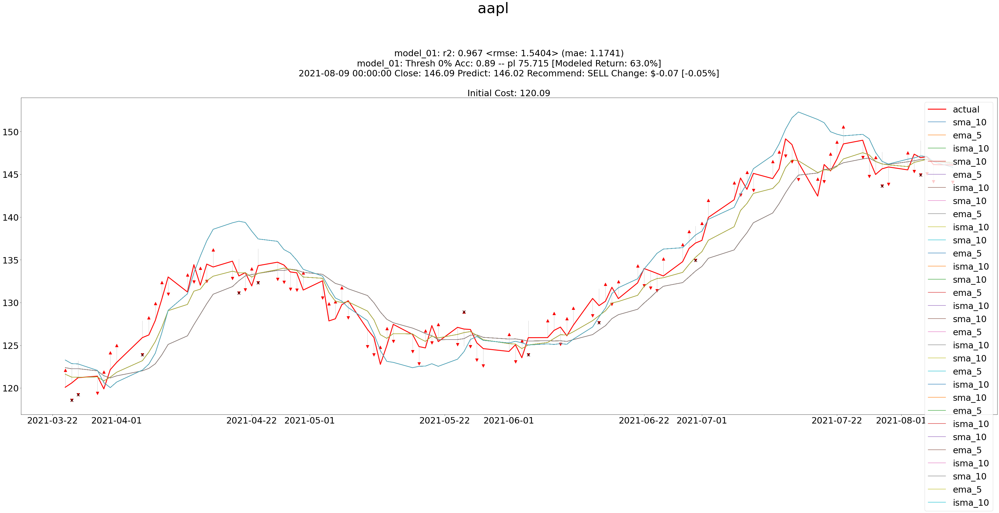

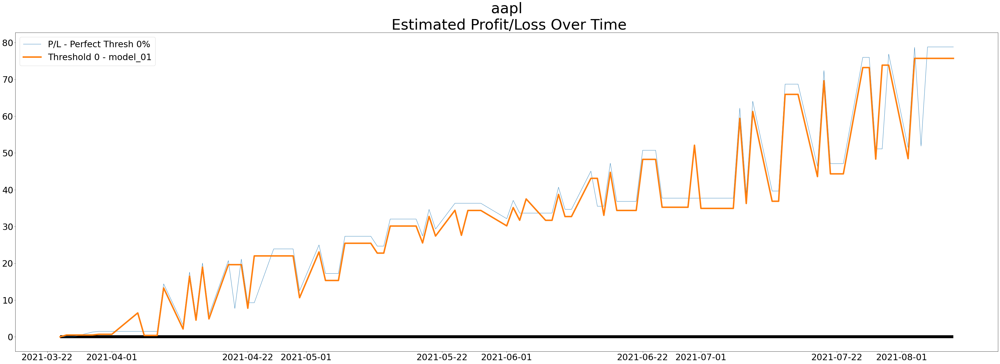

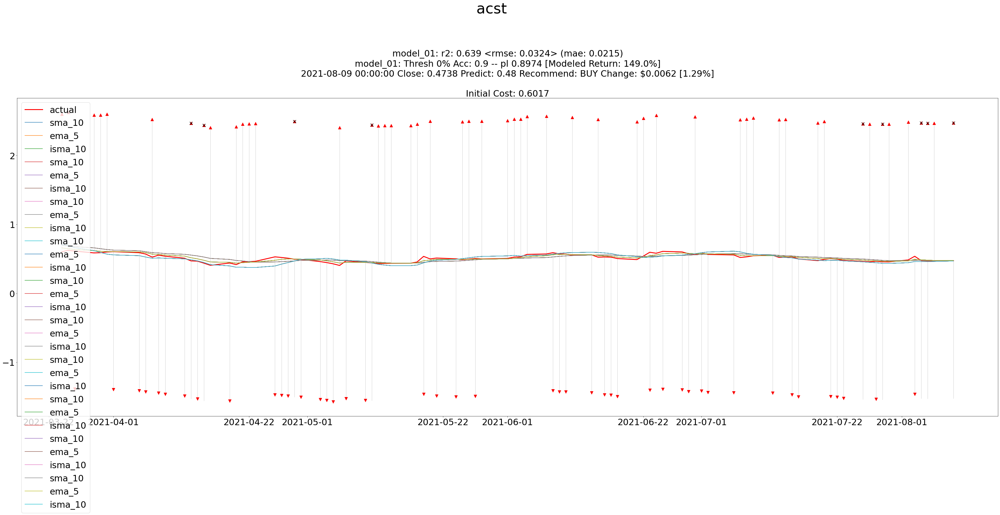

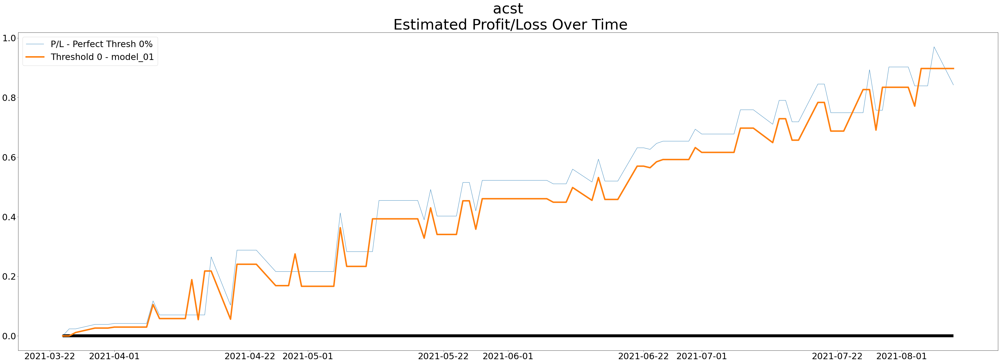

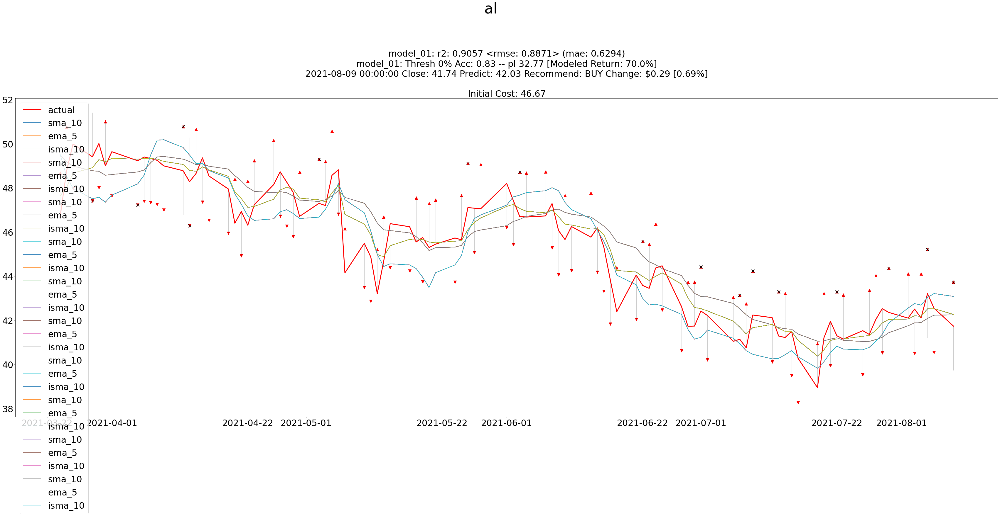

...

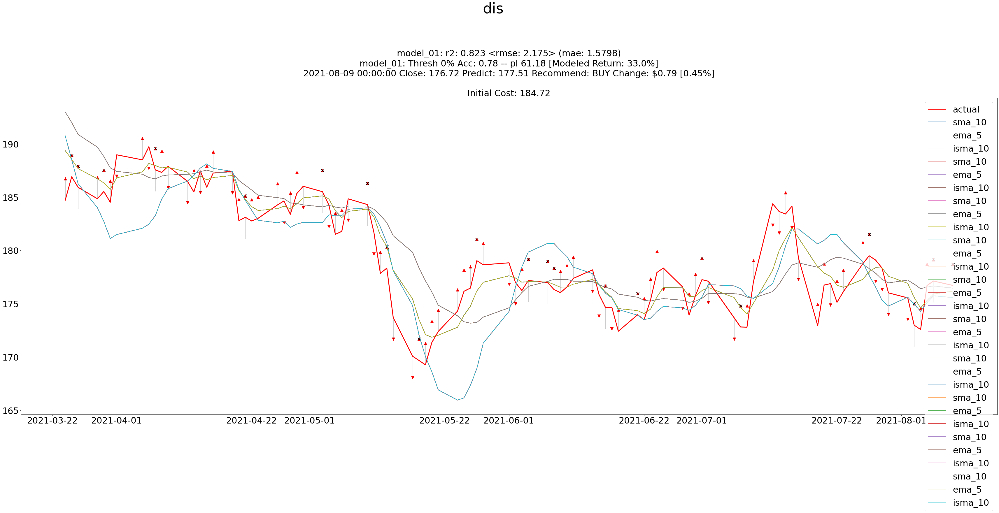

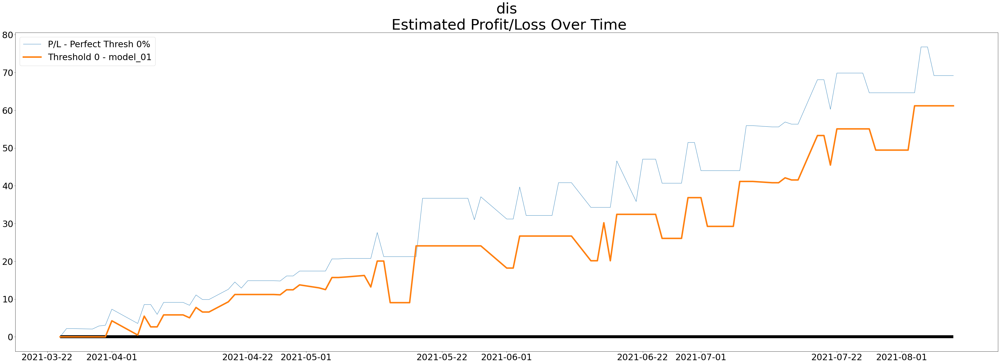

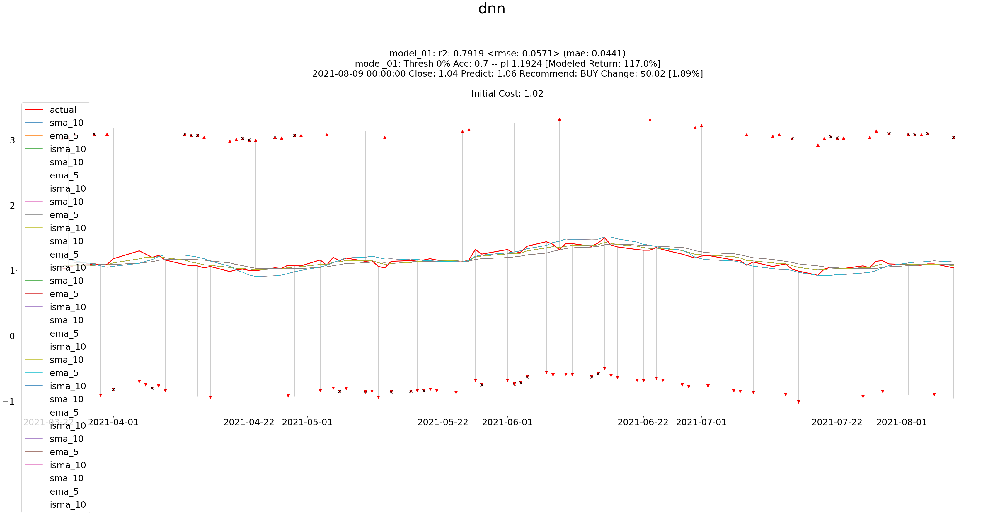

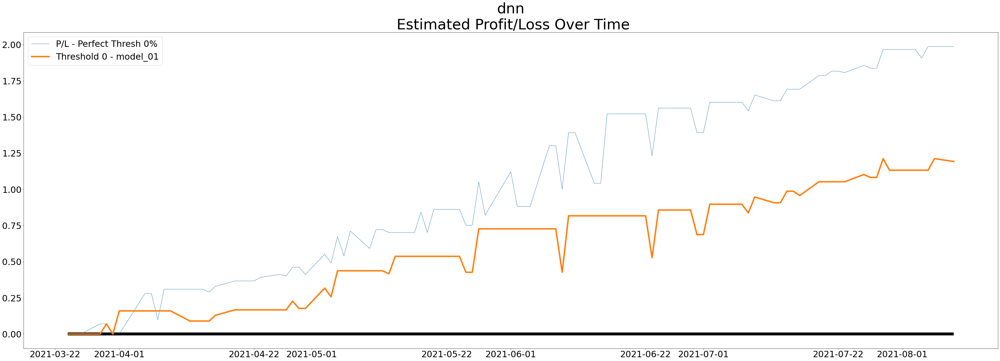

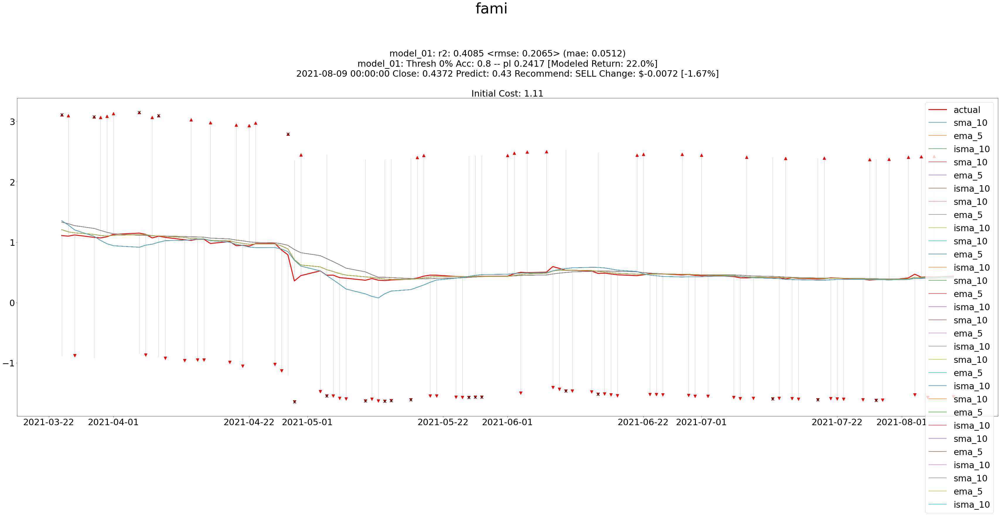

KeyboardInterrupt: 

In [16]:
#//********************************************************************************************************
#//*** This is Brilliant reference code.
#//**** Gotta Stash this somewhere
#//*** Get the index values where 1% of the Prediction is less than diff, then set those values to 0
#loop_df.loc[loop_df[loop_df['actual']*.01 > loop_df['diff']].index,'action_01'] = 0
#//********************************************************************************************************

def gather_predictions(symbols,interval,model_cols,thresholds):
    
    predict_df = pd.DataFrame()
    
    threshold_cols = []
    
    #//*** Combining Cached Symbol Predictions
    for symbol in symbols:
        predict_df = pd.concat([predict_df,pd.read_csv(f"./rotor/{symbol}_{interval}.csv")])

    for col in predict_df.columns:

        if col == 'symbol':
            continue
        elif col == 'time':
            #//*** Convert time column to datetime
            predict_df[col] = pd.to_datetime(predict_df[col])
        else:
            predict_df[col] = predict_df[col].astype("float")

    #//*** Build Ideal Trade Actions at a variety of Thresholds.
    #//*** These will represent Perfect trades and will be the control group.
    for thresh in thresholds:
        #//*** Generate action columns based on .01 and .05 Thresholds
        col_name = f'action_{int(thresh*100)}'
        threshold_cols.append(col_name)
        
    #//*** Build passthru_cols
    for col in predict_df.columns:

        for name in passthru_names:
            if name in col:
                passthru_cols.append(col)

    
    return  predict_df,threshold_cols,passthru_cols


def quick_summary(loop_df,model_cols,thresholds,display_rows=3):
    disp_cols = ['time','actual']
    
    out_df = pd.DataFrame()
    
    out_df['symbol'] = loop_df['symbol']
    out_df['time'] = loop_df['time']
    out_df['actual'] = loop_df['actual']
    
    
    for col in model_cols:
        
        out_df[col] = loop_df[col]
        
        for thresh in thresholds:
            #//*** Generate action columns based on .01 and .05 Thresholds
            
            action_col = f'action_{int(thresh*100)}'
            model_action_col = f'{col}_action_{int(thresh*100)}'

        out_df[f'signal_{int(thresh*100)}'] = loop_df[model_action_col].replace(1,"BUY").replace(0,"HOLD").replace(-1,"SELL")
        #out_df[f'acc_{int(thresh*100)}'] = (loop_df[action_col]==loop_df[model_action_col]).replace(True,"").replace(False,"X")
        out_df[f'change_{int(thresh*100)}'] = round((loop_df['actual'] - loop_df[col]) / loop_df['actual'],4)
        out_df[f'diff_{int(thresh*100)}'] = round(loop_df['actual'] - loop_df[col],4)
        
    
    
    return out_df.iloc[(display_rows*-1):]

def display_summary(predict_df,model_cols,thresholds,lines=3):

    #summary_df = pd.DataFrame()

    #//*** Plot each unique Stock Symbol in predict_df
    for group in predict_df.groupby('symbol'):
        #print(f"Plotting: {group[0]}")

        #//*** Initialize the Loop DataFrame
        loop_df = pd.DataFrame(group[1])

        #//*** Build all Model and Threshold Actions
        loop_df = project.build_model_actions(loop_df,model_cols,thresholds)


        print(quick_summary(loop_df,model_cols,thresholds,lines))
        print("============================================================================")

    #for group in summary_df.groupby('symbol'):
    #    print(group[1])


symbols = ['dis','sabr','rkt','ibkr','AAPL','MSFT','ATOS','SPY','NVCN','CTXR','ACST','DNN','AMD','SPRT','TDA','SENS','IMTE','GSAT','GNUS','AL','XELA','ZOM','WPRT','WHLR','TY','TTOO','TNXP','TBLT','SWI','SQBG','SNMP','RS','TSLA','RGLS','POWW','OIL','OI','OCGN','NRBO','NOC','NET','MVIS','MU','MSM','MRNA','MMT','MIK','METX','LODE','LMT','IQ','HGEN','GORO','GL','GE','FUV','FSR','CORT','CLOV','CFMS','CEI','BYSI','BTG','BNGO','BLNK','AUMN','ATVI','ASRT','AMC','ASM','FAMI','CRTD','PT']
##//****************************************
##//****************************************
##//****************************************
##//****************************************
#//**** BEGIN PLOTTING & Model Evaluation
##//****************************************
##//****************************************
##//****************************************
##//****************************************
start_time = time.time()

#//*** Maximum render time in seconds.
#//*** -1 No limit
max_runtime = 10
max_runtime = -1


predict_df = pd.DataFrame()

print(symbols)

#//*** Trade Thresholds to model. List of integeres for multiple threshold calculations on a single run
#//*** Thresholds are calculated per model. The plot can clutter quickle
thresholds = [0,.01,.02,.03,.04,.05]
thresholds = [0,.005,.01]
thresholds = [0]

#//*** Multiple models can be run simultaneously for comparison. The output can get cluttered quite quickly
training_cols = {
    #'model_02' : ['close',"isma_10",'volume','open','high','low',"ema_5"],
    'model_01' : ['close','volume','open','high','low'],
}

model_cols = training_cols.keys()

passthru_names = ['sma_','ema_']

#//*** Gather all Predictions and Threshold columns
predict_df,threshold_cols,passthru_cols = gather_predictions(symbols,'daily',model_cols,thresholds)


#//*** Display just the last # of predictions. Useful for making tomorrow decisions
display_summary(predict_df,model_cols,thresholds,1)


#//*** Plot each unique Stock Symbol in predict_df
for group in predict_df.groupby('symbol'):
    #print(f"Plotting: {group[0]}")

    #//*** Initialize the Loop DataFrame
    loop_df = pd.DataFrame(group[1])
    
    #//*** Build all Model and Threshold Actions
    loop_df = project.build_model_actions(loop_df,model_cols,thresholds)
        
    
    #//*** Plot the Chart history
    plot_history(loop_df,passthru_cols)
    #print(loop_df)
    
    #//*** Plot the Profit and loss
    plot_profit_loss(loop_df,model_cols,thresholds)

    #//*** Process for a fixed number of seconds. -1 indicates process all items
    if max_runtime > -1:
        if time.time() - start_time > max_runtime:
            print(f"Quit after {max_runtime}s")
            break


print (f"All Processing Complete")

    #ax.scatter(loop_df['time'],loop_df['plot_stock'],label='stock Prediction Win',color='red',marker="^",s=200)
    #ax.scatter(loop_df['time'],loop_df['plot_acc_stock'],label='stock Prediction Fail',color='black',marker="x",s=300)
    
    
    
    #linear_stock_r2 = round(r2_score(loop_df['predict'],loop_df['predict']),4)
    #linear_stock_rmse = round(sqrt(mean_squared_error(loop_df['action'], loop_df['action_stock'])),4)
    #linear_stock_error = round(get_mean_error(loop_df['action'],loop_df['action_stock']),4)
    #linear_stock_error = round(mean_absolute_error(loop_df['action'],loop_df['action_stock']),4)
    #linear_stock_acc = abs(round((loop_df['action'] == loop_df['action_stock']).sum() /len(loop_df),4))

    #threshold=.01
    #title += f"Stock   : - acc: {linear_stock_acc} r2: {linear_stock_r2} rmse: {linear_stock_rmse} mae: {linear_stock_error}\n"
    #title += f"perfect Trading Profit:   {threshold}(Threshold): {calc_pl(loop_df,'actual','action','predict',threshold,passthru=passthru_cols)}\n"
    #title += f"Stock Trading Profit:     {threshold}(Threshold): {calc_pl(loop_df,'actual','action_stock','linear_stock',threshold,passthru=passthru_cols)}\n\n"
    
    #tomorrow_date = (loop_df.iloc[-1]['time'] + pd.DateOffset(days=1)).date()
    #tomorrow_price = round(loop_df.iloc[-1]['predict'],2)
    #threshold_01 = abs((loop_df.iloc[-1]['actual'])*.01)
    #threshold_05 = abs((loop_df.iloc[-1]['actual'])*.05)
    #tomorrow_price_change = abs(loop_df.iloc[-1]['actual']-tomorrow_price)
    
    #recommend_01 = "ACTION?"
    #recommend_05 = "ACTION?"
    
    #if tomorrow_price_change < threshold_01:
    #    recommend_01 = "HOLD"
    #elif loop_df.iloc[-1]['actual'] < tomorrow_price:
    #        recommend_01 = "BUY"         
    #else:
    #    recommend_01 = "SELL"         

    
    
    #if tomorrow_price_change < threshold_05:
    #    recommend_05 = "HOLD"

    #elif loop_df.iloc[-1]['actual'] < tomorrow_price:
    #        recommend_05 = "BUY"         
    #else:
    #    recommend_05 = "SELL"         

    #title+=f"{loop_df.iloc[-1]['time'].date()} [${loop_df.iloc[-1]['actual']}] ===> {tomorrow_date} [${tomorrow_price}]\n"
    #title+=f"Predicted Price Change: {round(tomorrow_price_change,4)} -- Threshold: .01: {round(threshold_01,2)} Threshold: .05: {round(threshold_05,2)}\n\n"
    #title+=f"Strategy - 1%: {recommend_01} -- 5% {recommend_05}\n"
    #for thresh in thresholds:
    #    title+= f'Perfect Trade Thresh {int(thresh*100)} -- pl: ${calc_results(loop_df,"pl",actual="actual",predict="predict",model = f"action_{int(thresh*100)}")}\n '
    

In [6]:
#//******************************************************************************
#//*** Builds the URL request based on the symbol and type of data requested.
#//*** Initially, this does the daily numbers.
#//*** Can easily be scaled up to add many different URL request types
#//******************************************************************************
def build_url(input_action,input_symbol,m=1,y=1):
    #//*** Valid Actions:
    #//*******  Daily: Gets the historical daily closing price for up to 20 years
    
    if input_action == 'daily':
        action = "TIME_SERIES_DAILY"
        out = ""
        out += f'https://www.alphavantage.co/query?'
        out += f'function={action}'
        out += f'&symbol={symbol}'
        out += f'&outputsize=full'
        out += f'&apikey={av_apikey}'
        
        return out
    
    if input_action == '1min':
        action = "TIME_SERIES_INTRADAY_EXTENDED"
        out = ""
        out += f'https://www.alphavantage.co/query?'
        out += f'function={action}'
        out += f'&symbol={symbol}'
        out += f'&outputsize=full'
        out += f'&slice=year{y}month{m}'
        out += f'&interval=1min'
        #out += "datatype=json"
        #out += f'&adjusted=true',
        #out += "&slice=year1month1",
        out += f'&apikey={av_apikey}'
        
        return out
    
    if input_action == '60min':
        action = "TIME_SERIES_INTRADAY_EXTENDED"
        out = ""
        out += f'https://www.alphavantage.co/query?'
        out += f'function={action}'
        out += f'&symbol={symbol}'
        out += f'&outputsize=full'
        out += f'&slice=year{y}month{m}'
        out += f'&interval=60min'
        #out += "datatype=json"
        #out += f'&adjusted=true',
        #out += "&slice=year1month1",
        out += f'&apikey={av_apikey}'

    return out
    print(f"Invalid Action: {input_action}")
    print(f"No URL Returned, PLease try again")
    return None
    

#//*** Prepare the raw stock information for modeling
#//*** 1. Convert Time Date to Date Formatting
#//*** 2. Generates the target predictions for training. targets is an integer list used generate future targets. 
#//***    This allows multiple independent variables to be generated in a single pass. Although the current model 
#//***    Only Processes one independent variable per run. This can be scaled to multiple predictions if needed
#//***    in the future
#//*** 3. Reorder Stocks in Descending order.
def build_stocks(symbol,interval,targets):
    
    stock_df = pd.read_csv(f"./stocks/{symbol}_{interval}.csv.zip")
    stock_df
    
    if 'date' in stock_df.columns:
        stock_df['date'] = pd.to_datetime(stock_df['date'])
        stock_df = stock_df.rename(columns={'date':'time'})
    else:
        stock_df['time'] = pd.to_datetime(stock_df['time'])
    
    for offset in targets:
        #//*** create a list of nan values of x length
        nan_list = list(np.empty( offset )* np.nan )

        #//*** Create target variable Price which is stocks + x columns in advance
        #//*** Takes the closing price starting at x and gets the remainder, this generates the offset
        #//*** nan_list fills the missing x values with nans
        target_list = nan_list + list(stock_df['close'])
        target_list.pop()
        stock_df[f'target_{offset}'] = target_list 
    
    stock_df = stock_df[:offset*-1]
    
    #//*** Reorder by time descending
    stock_df.sort_values('time',inplace=True, ignore_index=True)
    
    return stock_df


#//****************************************************************************************
#//*** Generates an inverse data set centered around a reference data set.
#//*** The value as a technical indicator is very much in the discovery phase
#//*** Presently used to used to invert actual prices around a simple moving average
#//*** The idea is to negate the lag in a simple moving average.
#//*** It's an interesting concept that has a value of dubious veracity
#//****************************************************************************************
#//*** Also looking at reversing values as the primary crosses the reference
#//*** It would be like generating an inverted curve that is entirely positive or negative 
#//*** Relative to the reference.
#//****************************************************************************************
def build_inverted_curve(primary,reference):
    
    #diff = primary - reference
    #print(primary + (diff*2))
    #return primary + (diff*2)
    
    df = pd.DataFrame()
    df['primary'] = primary
    df['reference'] = reference
    
    out = []
    for row in df.iterrows():
        
        #//*** Ignore Nan
        if np.isnan(row[1]['primary']):
            out.append(np.nan)
            continue

        if np.isnan(row[1]['reference']):
            out.append(np.nan)
            continue
            
        #//*** Generate Difference
        diff = ((row[1]['primary'] - row[1]['reference']))
        diff *= 1.5
        
        #//*** Combine results.
        result = row[1]['primary']+diff
        
        out.append(result)
        
    
    return pd.Series(out)

#//*** Calculate the Exponential Moving Average. 
#//*** Code acquired from 3rd party
def calculate_ema(prices, days, smoothing=2):
    #print(len(prices))
    ema = [sum(prices[:days]) / days]
    for price in prices[days:]:
        ema.append((price * (smoothing / (1 + days))) + ema[-1] * (1 - (smoothing / (1 + days))))
    #print(len(ema))
    
    ema = (list(np.empty(len(prices)-len(ema))*np.nan) + ema)
    #print(len(ema))
    return ema

#//*********************************************************************************************************************
#//*** All Purpose function for generating actions based on predicted data.
#//*** Action: action - Generates Buy/Hold/Sell signals (1/0/-1). Takes Actual Data, Prediction, Trade Threshold.
#//******************   Uses iterrows() to explicitly calculate each action individually. Very deliberate choice
#//******************   to avoid data leakage. Trade Threshold expressed as a percentage, is a minimum threshold
#//******************   to execute a trade. Example: 5% Threshold a predicted price must change by 5% of the 
#//******************   current price to execute. If the current price is $1, a trade will only execute if the
#//******************   predicted value is less than .95 or greater than 1.05. Higher thresholds indicate
#//******************   more conservative and less volatile strategies. One threshold limits are met, there
#//******************   is an explict decision tree of actions to take. 
#//*********************************************************************************************************************
#//*** Action: accuracy - Generates a simple accuracy percentage from actual and predicted values. Compares actual to 
#//******************   predicted. Counts rows where the values are identical.
#//*********************************************************************************************************************
#//*** Action: pl -     Generates predicted Profit/Loss based on modeled trading strategy. Walks through each buy/hold/sell
#//******************   action and simulates the profit/loss associated with the action. Each buy/sell/hold action is 
#//******************   explicitly handled. The resulting decision is based on the previousl buy/sell/hold action.
#//******************   Example: A stock can't be sold if it hasn't been bought. This leads to 9 possible outcomes 
#//******************   for each action based on the previous buy/sell/hold action. The variable position holds the
#//******************   current buy/sell/hold action as a trinary value 1/-1/0. Current_price is used to keep track
#//******************   of whether a stock is currently held, and at what price.
#//*********************************************************************************************************************
def calc_results(input_df,action,**kwargs):
    
    input_df = input_df.copy()
    
    threshold = 0
    actual_col = None
    predict_col = None
    action_col = None
    model_col = None
    get_list = False
    verbose = False
    
    for arg in kwargs:
        
        if arg == 'threshold':
            threshold = kwargs[arg]
        
        if arg == 'actual':
            actual_col = kwargs[arg]
        
        if arg == 'predict':
            predict_col = kwargs[arg]
    
        if arg == 'model':
            model_col = kwargs[arg]
    
        if arg == 'get_list':
            get_list = kwargs[arg]

        if arg == 'verbose':
            verbose = kwargs[arg]

    current_price = input_df[actual_col].iloc[0]
    
    if action=='action':
        
        #input_df['diff'] = input_df[actual_col] - input_df[predict_col]
        
        out = []
        #//*** Loop through each element
        for row in input_df.iterrows():
            
            #//*** Calculate the Row Difference as an absolute value
            row_diff = abs(current_price - row[1][predict_col] )
            
            row_thresh = current_price * threshold
            
            #//*** If the row_diff is less than the row_thresh. We are not predicting a huge price move
            #//*** Set position to 0, curent_price remains the same.
            if row_diff < row_thresh:
                #//*** Set position to hold
                out.append(0)
                continue
            else:
                #//*** Difference exceeds threshold Commit to buy sell action
                
                #//*** Actual less than Predicted. Perform Buy
                if row[1][actual_col] < row[1][predict_col]:
                       
                        #//*** Set Position to buy
                        out.append(1)
    
                        #//*** Set the Current Price for Thresholding
                        current_price = row[1][actual_col]
                        continue
                
                #//** Actual is greater than Predicted. Perform Sell
                else:
                        #//*** Set Position to Sell
                        out.append(-1)
    
                        #//*** Set the Current Price for Thresholding
                        current_price = row[1][actual_col]
                        continue
        
        #//*** Actions at Threshold Built Return it 
        return (out)

    #//**************************************
    #//**************************************
    #//**************************************
    #//**** END action=='action'
    #//**************************************
    #//**************************************
    #//**************************************
    
    if action == 'pl':
        
        #print(input_df[[actual_col,predict_col,model_col]])
        
        current_price = input_df.iloc[0][actual_col]
        pl = 0
        
        #pl -= current_price
        
        initial_price = current_price
        
        position = 1
        
        pl_list = []
        
        if verbose:
            print(f"Model Col: {model_col}")
            print(f"Actual Col: {actual_col}")
        
        
        
        for row in input_df.iterrows():

            if verbose:
                print(row[1][model_col],row[1][actual_col],current_price,pl,position)
            
            #//*** Sell Action
            if row[1][model_col] == -1:
                if verbose:
                    print("---Sell: ",position,current_price,pl)

                #//*** Perform action based on Position
                
                #//*** We have already sold
                #//*** Do Nothing and maintain Sell
                if position == -1:
                    if verbose:
                        print("------Already Sold")
                    pl_list.append(pl)
                    continue
                
                #//*** We Are holding From a Previous Position
                #//*** Check Current Price, If we have a current Price, then sell
                elif position == 0:
                    if verbose:
                        print("------Actualy Sell")
                    
                    
                    position = -1
                    
                    #//*** We have Stock, Sell it
                    if current_price > 0:
                    
                        pl += (row[1][actual_col] - initial_price)

                        current_price = 0
                

                #//*** We Previously Bought
                #//*** Change position and Sell
                elif position == 1:
                    
                    position = -1

                    #//*** Double Check current_Price to verify we can sell
                    if current_price > 0:
                        if verbose:
                            print("------Actualy Sell")
                        pl += (row[1][actual_col] - initial_price)

                        current_price = 0
                
            #//*** Hold Action
            #Basically Maintain the current Position
            elif row[1][model_col] == 0:
                if verbose:
                    print("---Hold")
                if position == -1:
                    position = 0
                    
                elif position == 0:
                    position = 0
                    
                elif position == 1:
                    position = 0
                    
                
            #//*** Buy Action
            elif row[1][model_col] == 1:
                if verbose:
                    print("---Buy")
                
                #//*** Previously Sold
                #//*** Let's Buy
                if position == -1:
                    
                    position = 1
                    
                    #//*** Double Check current_price
                    if current_price == 0:
                        
                        if verbose:
                            print("------Actually Buy -1")
                        
                        current_price = row[1][actual_col]
                        
                        pl -= (row[1][actual_col] - initial_price)
                
                #//*** Currently Holding. Let's Buy if we havent already
                elif position == 0:
                    position = 1
                    
                    #//*** Double Check current_price
                    if current_price == 0:

                        if verbose:
                            print("------Actually Buy 0")
                        
                        current_price = row[1][actual_col]
                        
                        pl -= (row[1][actual_col] - initial_price)
                
                #//*** We have already bought
                elif position == 1:
                    position = 1
                    
                    if verbose:
                        print("------Already Bought")
                        
                    pl_list.append(pl)

                    continue
            pl_list.append(pl)

        if get_list == True:
            return pl_list
        
        return round(pl,4)
            
#//*** Generate the simple accuracy of the Actual vs predicted values
    if action == 'accuracy':
        if verbose:
            print(f"Actual: {actual_col} Predict: {predict_col}")
        return (input_df[actual_col] == input_df[predict_col]).astype(int)
    
    if action == 'r2':
        if verbose:
            print(f"r2 Actual: {actual_col} Predict: {predict_col}")

        #//*** Return r2 score
        return round(r2_score(input_df[actual_col],input_df[predict_col]),4)
    
    if action == 'rmse':
        if verbose:
            print(f"rmse Actual: {actual_col} Predict: {predict_col}")

        #//*** Return Root Mean Squared Error
        return round(sqrt(mean_squared_error(input_df[actual_col],input_df[predict_col])),4)
    
    if action == 'mae':
        if verbose:
            print(f"rmse Actual: {actual_col} Predict: {predict_col}")

        #//*** Return Mean Absolute Error
        return round(mean_absolute_error(input_df[actual_col],input_df[predict_col]),4)
    
    
    #//**************************************
    #//**************************************
    #//**************************************
    #//**** END action=='Accuracy'
    #//**************************************
    #//**************************************
    #//**************************************
    
#//**************************************
#//**************************************
#//*** END Calc Results
#//**************************************
#//**************************************


#build_stocks('rkt','daily',[1]).tail(60)
#calc_pl(loop_df,'actual','action_stock','linear_stock',threshold,get_list=False)

In [ ]:
#//**** Backup copy
#symbols = ['dis','sabr','rkt','ibkr','AAPL','MSFT','ATOS','SPY','NVCN','CTXR','ACST','DNN','AMD','SPRT','TDA','SENS','IMTE','GSAT','GNUS','AL','XELA','ZOM','WPRT','WHLR','TY','TTOO','TNXP','TBLT','SWI','SQBG','SNMP','RS','TSLA','RGLS','POWW','OIL','OI','OCGN','NRBO','NOC','NET','MVIS','MU','MSM','MRNA','MMT','MIK','METX','LODE','LMT','IQ','HGEN','GORO','GL','GE','FUV','FSR','CORT','CLOV','CFMS','CEI','BYSI','BTG','BNGO','BLNK','AUMN','ATVI','ASRT','AMC','ASM','FAMI','CRTD','PT']
##//****************************************
##//****************************************
##//****************************************
##//****************************************
#//**** BEGIN PLOTTING & Model Evaluation
##//****************************************
##//****************************************
##//****************************************
##//****************************************
start_time = time.time()

#//*** Maximum render time in seconds.
#//*** -1 No limit
max_runtime = 10
max_runtime = -1


predict_df = pd.DataFrame()

print(symbols)

#//*** Trade Thresholds to model. List of integeres for multiple threshold calculations on a single run
#//*** Thresholds are calculated per model. The plot can clutter quickle
thresholds = [0,.01,.02,.03,.04,.05]
thresholds = [0,.005,.01]
thresholds = [0]

#//*** Combining Cached Symbol Predictions
for symbol in symbols:
    predict_df = pd.concat([predict_df,pd.read_csv(f"./rotor/{symbol}_{interval}.csv")])

for col in predict_df.columns:
    
    if col == 'symbol':
        continue
    elif col == 'time':
        #//*** Convert time column to datetime
        predict_df[col] = pd.to_datetime(predict_df[col])
    else:
        predict_df[col] = predict_df[col].astype("float")

#print(predict_df)
#//*** Plot each unique Stock Symbol in predict_df
for group in predict_df.groupby('symbol'):
    print(f"Plotting: {group[0]}")

    
    loop_df = pd.DataFrame(group[1])
    #print(loop_df)
    
    threshold_cols = []
    
    #//*** Build Ideal Trade Actions at a variety of Thresholds.
    #//*** These will represent Perfect trades and will be the control group.
    for thresh in thresholds:
        #//*** Generate action columns based on .01 and .05 Thresholds
        col_name = f'action_{int(thresh*100)}'
        threshold_cols.append(col_name)
        
        loop_df[col_name] = calc_results(loop_df,"action",actual='actual',predict='predict',threshold=thresh)
    
    #//********************************************************************************************************
    #//*** This is Brilliant reference code.
    #//**** Gotta Stash this somewhere
    #//*** Get the index values where 1% of the Prediction is less than diff, then set those values to 0
    #loop_df.loc[loop_df[loop_df['actual']*.01 > loop_df['diff']].index,'action_01'] = 0
    #//********************************************************************************************************

    

    #//*** Build buy/sell/hold actions for each model
    for col in model_cols:
        
        #//*** Build Bey/Sell/Hold Actions at each Threshold (for each Model)
        #//*** Calc_results (Action Model) generates actions based on actual values (post-close market), compares preditions, generates
        #//*** Buy/Sell/Hold action based on threshold.
        #//*** This is per model/ per threshold. There can be many model predictions per run
        for thresh in thresholds:
            loop_df[f'{col}_action_{int(thresh*100)}'] = calc_results(loop_df,"action",actual='actual',predict=col,threshold=thresh)


    fig,ax = plt.subplots()

    fig.set_figheight(20)
    fig.set_figwidth(60)

    small_text=30
    symbol_size = 100

    #//*****************************************************************
    #//*** Plot the thresholded Buy Sell Bars based
    #//*** Only Draw Bars Where there is a clear Buy/Sell Signal
    #//*****************************************************************
    
    base_thresh_height =  (len(threshold_cols)*2) 
    base_thresh_width = 1

    #//*** Plot the Optimal Threshold Buy Sell Lines
    for thresh_col in threshold_cols:
        trans = .2
        for x in range(0,len(loop_df)):
            if loop_df.iloc[x][thresh_col] == -1:
                plt.vlines(loop_df.iloc[x]['time'],loop_df.iloc[x]['actual']-base_thresh_height,loop_df.iloc[x]['actual'],linewidth=base_thresh_width,alpha=trans)
            elif loop_df.iloc[x][thresh_col] == 1:
                plt.vlines(loop_df.iloc[x]['time'],loop_df.iloc[x]['actual'],loop_df.iloc[x]['actual']+base_thresh_height,linewidth=base_thresh_width,alpha=trans)
        
        #//*** Thresh_Col Drawn, Adjust Line Heights. Future cols get shorter and fatter
        base_thresh_width += 4
        base_thresh_height -= 2

    #//*** Plot the Actual Price
    ax.plot(loop_df['time'],loop_df['actual'],label='actual',color='red',linewidth=3 )
    
    plot_df = loop_df.copy()
    plot_df['model_01_action_0'] = plot_df['model_01_action_0'].replace(-1,np.nan)
    
    #//*** Plot the modeled Threshold Actions
    
    #//*** For Each Model Column
    for col in model_cols:
        
        base_thresh_height = (len(threshold_cols)*2) 

        #//*** Build Model Actions for each Threshold Value
        #//*** The Column name is the base with the action Threshold appended
        for thresh in thresholds:
            loop_col = f'{col}_action_{int(thresh*100)}'
            
            #//*** Plot Positive values
            plot_df = loop_df.copy()
            plot_df[loop_col] = plot_df[loop_col].replace(-1,np.nan)
            ax.scatter(plot_df['time'], (plot_df[loop_col]*base_thresh_height)+loop_df['actual'],s=symbol_size,color='red',marker="^" )
            
            #//*** Plot Negative values
            plot_df = loop_df.copy()
            plot_df[loop_col] = plot_df[loop_col].replace(1,np.nan)
            ax.scatter(plot_df['time'], (plot_df[loop_col]*base_thresh_height)+loop_df['actual'],s=symbol_size,color='red',marker="v" )

            #//*** Get a series representing the simple accuracy of each prediction.
            #//*** 1 = Accurate
            #//*** 0 = Fail
            
            
            plot_df = loop_df.copy()
            
            #//*** Multiply the Model Action by the inverted accuracy. 0 is success, 1 = fail
            #//*** This keeps the values to cover
            plot_df['temp'] =  abs(calc_results(loop_df,"accuracy",actual=f'action_{int(thresh*100)}',predict=loop_col)-1).replace(0,np.nan)*plot_df[loop_col]
            ax.scatter(plot_df['time'], (plot_df['temp']*base_thresh_height)+loop_df['actual'],s=symbol_size,color='black',marker="x" )

    
            base_thresh_height -= 2
    
        #//*** Only show accuracy of the first model
        break
    
    #//*** Plot Passthru Columns
    for col in passthru_cols:
        ax.plot(loop_df['time'],loop_df[col],label=col)

    title = ""
    
    
    title+="\n\n"
    
    #print(loop_df)
    for col in model_cols:
        
        base_thresh_height = (len(threshold_cols)*2) 
        
        
        title += f'{col}: r2: {calc_results(loop_df,"r2",actual="actual",predict=col)} <rmse: {calc_results(loop_df,"rmse",actual="actual",predict=col)}> (mae: {calc_results(loop_df,"mae",actual="actual",predict=col)})\n'
        #//*** Build Model Actions for each Threshold Value
        #//*** The Column name is the base with the action Threshold appended
        for thresh in thresholds:
            loop_col = f'{col}_action_{int(thresh*100)}'
            acc = round(calc_results(loop_df,"accuracy",actual=f"action_{int(thresh*100)}",predict=loop_col,verbose=False).sum()/len(loop_df),2)
            loop_pl = calc_results(loop_df,"pl",actual="actual",model = loop_col,verbose=False)
            
            
            title += f'{col}: Thresh {int(thresh*100)}% Acc: {acc} -- pl {loop_pl} [Modeled Return: {(round(loop_pl/(loop_df["actual"].iloc[0]),2))*100}%]\n'
            actual_value = loop_df.iloc[-1]['actual']
            model_prediction = round(loop_df.iloc[-1][col],2)
            
            predicted_change = round(1-(actual_value /  model_prediction ),4) 
            
            predicted_action = loop_df.iloc[-1][f'{col}_action_{int(thresh*100)}']
            
            if predicted_action == 1:
                predicted_action = "BUY"
            elif predicted_action == 0:
                predicted_action = "HOLD"
            elif predicted_action == -1:
                predicted_action = "SELL"
                
                
            
            title += f"{loop_df.iloc[-1]['time']} Close: {actual_value} Predict: {model_prediction} Recommend: {predicted_action} Change: ${round(model_prediction - actual_value,4)} [{round(predicted_change*100,4)}%]\n"

        #tomorrow_date = (loop_df.iloc[-1]['time'] + pd.DateOffset(days=1)).date()
        #tomorrow_price = round(loop_df.iloc[-1]['predict'],2)
        #threshold_01 = abs((loop_df.iloc[-1]['actual'])*.01)
        #threshold_05 = abs((loop_df.iloc[-1]['actual'])*.05)
        #tomorrow_price_change = abs(loop_df.iloc[-1]['actual']-tomorrow_price)

        #recommend_01 = "ACTION?"
        #recommend_05 = "ACTION?"

        #if tomorrow_price_change < threshold_01:
        #    recommend_01 = "HOLD"
        #elif loop_df.iloc[-1]['actual'] < tomorrow_price:
        #        recommend_01 = "BUY"         
        #else:
        #    recommend_01 = "SELL"         



        #if tomorrow_price_change < threshold_05:
        #    recommend_05 = "HOLD"

        #elif loop_df.iloc[-1]['actual'] < tomorrow_price:
        #        recommend_05 = "BUY"         
        #else:
        #    recommend_05 = "SELL"         

        title+="\n"

    
    title += f"Initial Cost: {(loop_df['actual'].iloc[0])}"
      
    #//*** Suptitle needs to be positioned above the title. The position (y Value)
    plt.suptitle(f"{group[0]}",fontsize=50,y=1+(title.count("\n")*.018))
    plt.title(title,fontsize=small_text)
    plt.xticks(fontsize=small_text)
    plt.yticks(fontsize=small_text)
    plt.legend(fontsize=small_text)
    plt.show()
    
    fig,ax = plt.subplots()

    fig.set_figheight(20)
    fig.set_figwidth(60)
    
    ax.hlines(0,loop_df['time'].min(),loop_df['time'].max(),color="black",linewidth=10)
    
    
    #//*** Build Model Actions for each Threshold Value
    #//*** The Column name is the base with the action Threshold appended
    for thresh in thresholds:
        loop_col = f'action_{int(thresh*100)}'
        #//*** Plot the PL chart
        ax.plot(loop_df['time'],calc_results(loop_df,"pl",actual='actual',model = loop_col,get_list=True),linewidth=1,label=f"P/L - Perfect Thresh {thresh}%" )
        
    
    for col in model_cols:
        for thresh in thresholds:
            #//*** Model Column name
            loop_col = f'{col}_action_{int(thresh*100)}'
            
            #//*** Plot the PL chart
            ax.plot(loop_df['time'],calc_results(loop_df,"pl",actual='actual',model = loop_col,get_list=True),linewidth=5,label=f"Threshold {thresh} - {col}" )
    
    ax.hlines(0,loop_df['time'].min(),loop_df['time'].max(),color="black",linewidth=10)
    plt.title(f"{group[0]}\n Estimated Profit/Loss Over Time",fontsize=50)
    
    plt.xticks(fontsize=small_text)
    plt.yticks(fontsize=small_text)
    plt.legend(fontsize=small_text)
    plt.show()
    
    #//*** Process for a fixed number of seconds. -1 indicates process all items
    if max_runtime > -1:
        if time.time() - start_time > max_runtime:
            print(f"Quit after {max_runtime}s")
            break
 
        
print (f"All Processing Complete")

    #ax.scatter(loop_df['time'],loop_df['plot_stock'],label='stock Prediction Win',color='red',marker="^",s=200)
    #ax.scatter(loop_df['time'],loop_df['plot_acc_stock'],label='stock Prediction Fail',color='black',marker="x",s=300)
    
    
    
    #linear_stock_r2 = round(r2_score(loop_df['predict'],loop_df['predict']),4)
    #linear_stock_rmse = round(sqrt(mean_squared_error(loop_df['action'], loop_df['action_stock'])),4)
    #linear_stock_error = round(get_mean_error(loop_df['action'],loop_df['action_stock']),4)
    #linear_stock_error = round(mean_absolute_error(loop_df['action'],loop_df['action_stock']),4)
    #linear_stock_acc = abs(round((loop_df['action'] == loop_df['action_stock']).sum() /len(loop_df),4))

    #threshold=.01
    #title += f"Stock   : - acc: {linear_stock_acc} r2: {linear_stock_r2} rmse: {linear_stock_rmse} mae: {linear_stock_error}\n"
    #title += f"perfect Trading Profit:   {threshold}(Threshold): {calc_pl(loop_df,'actual','action','predict',threshold,passthru=passthru_cols)}\n"
    #title += f"Stock Trading Profit:     {threshold}(Threshold): {calc_pl(loop_df,'actual','action_stock','linear_stock',threshold,passthru=passthru_cols)}\n\n"
    
    #tomorrow_date = (loop_df.iloc[-1]['time'] + pd.DateOffset(days=1)).date()
    #tomorrow_price = round(loop_df.iloc[-1]['predict'],2)
    #threshold_01 = abs((loop_df.iloc[-1]['actual'])*.01)
    #threshold_05 = abs((loop_df.iloc[-1]['actual'])*.05)
    #tomorrow_price_change = abs(loop_df.iloc[-1]['actual']-tomorrow_price)
    
    #recommend_01 = "ACTION?"
    #recommend_05 = "ACTION?"
    
    #if tomorrow_price_change < threshold_01:
    #    recommend_01 = "HOLD"
    #elif loop_df.iloc[-1]['actual'] < tomorrow_price:
    #        recommend_01 = "BUY"         
    #else:
    #    recommend_01 = "SELL"         

    
    
    #if tomorrow_price_change < threshold_05:
    #    recommend_05 = "HOLD"

    #elif loop_df.iloc[-1]['actual'] < tomorrow_price:
    #        recommend_05 = "BUY"         
    #else:
    #    recommend_05 = "SELL"         

    #title+=f"{loop_df.iloc[-1]['time'].date()} [${loop_df.iloc[-1]['actual']}] ===> {tomorrow_date} [${tomorrow_price}]\n"
    #title+=f"Predicted Price Change: {round(tomorrow_price_change,4)} -- Threshold: .01: {round(threshold_01,2)} Threshold: .05: {round(threshold_05,2)}\n\n"
    #title+=f"Strategy - 1%: {recommend_01} -- 5% {recommend_05}\n"
    #for thresh in thresholds:
    #    title+= f'Perfect Trade Thresh {int(thresh*100)} -- pl: ${calc_results(loop_df,"pl",actual="actual",predict="predict",model = f"action_{int(thresh*100)}")}\n '
    

In [ ]:
loop_df.head(30)

In [ ]:
print(loop_df.tail(30))

In [ ]:
#//*** Basic Profit loss calculator
def calc_pl(input_df,col_actual,col_action,col_predict,threshold=0,**kwargs):
    
    get_list = False
    
    out_position = []
    out_pl = []
    
    for arg in kwargs:
        
        if arg == 'get_list':
            get_list = kwargs[arg]
    
    #print(input_df)
    #df = input_df[[actual,action]]
    pl = input_df.iloc[0][col_actual]
    pl = 0
    
    #//*** Negative value to reflect initial cost buy-in
    pl = input_df.iloc[0][col_actual] * -1
    #//*** Position -1 Sell, 0 Hold, 1 Buy
    position = 0
    
    current_price = input_df.iloc[0][col_actual]
    trade_threshold = input_df.iloc[0][col_actual] * threshold
    
    pl_min = 0
    pl_max = 0
    for row in input_df.iterrows():
        
        price = row[1][col_actual]
        action = row[1][col_action]
        predict = row[1][col_predict]
        
        #//*** Check if price movement is greater than the trade threshold
        #//*** We only want to make a move if the price difference is greater than threshold (.01 default) in either direction
        #print(trade_threshold,abs(price-predict))
        
        if trade_threshold > abs(current_price-predict):
            #//*** Below Threshold skip action
            position = 0
            out_pl.append(pl)
            #print(f"Below Threshold: {current_price} <> {trade_threshold} <> {predict}")
            continue
    
        #//Buy Hold Sell
        if action == 0:
            #print("Sell: ",pl,position,row[1][col_actual],row[1][col_action])
            #//*** Prediction indicates sell
            if position == -1:
                              
                #//*** We have already sold. Stay out do nothing
                position = -1
                
                
            else:
                #//*** Holding Stock or bought stock. Convert to cash
                pl += price
                position = -1

                trade_threshold = price * threshold
                current_price = price
                #print(f"Sold: {price} - {trade_threshold}")
                
                #print(f"sold at {price} P/L: {pl} ")
        
        if action == 1:
            #print("Buy: ",pl,position,row[1][col_actual],row[1][col_action])
            #//*** Indicates buy
            if position == -1:
                #//**** We Sold, it's time to buy
                pl -= price
                position = 1

                trade_threshold = price * threshold
                current_price = price
                #print(f"buy: {price} - {trade_threshold}")

                #print(f"bought at {price} P/L: {pl} ")
                
        out_pl.append(pl)
        if pl > pl_max:
            pl_max = pl
        if pl < pl_min:
            pl_min = pl
    if get_list:
        return out_pl
    #return (round(pl,2),round(pl_min,2),round(pl_max,2))
    return round(pl,2)

def get_mean_error(predictions, actuals):
    mean_error = (sum(predictions) - sum(actuals))/len(actuals)
    return mean_error


def best_fit_slope_and_intercept(xs,ys):

    
    m = (((xs.mean()*ys.mean()) - (xs*ys).mean() ) /
         ((xs.mean()*xs.mean()) - (xs*xs).mean()))

    b = ys.mean() - m*xs.mean()
    
    return m, b

def slope(x1, y1, x2, y2):
    s = (y2-y1)/(x2-x1)
    return s


In [ ]:

#//**** Get all Stocks to Model

#//*** Define the interval to working in. This model is built around daily stock information
#//*** could be adjusted to difeeren
interval="daily"

training_days = 30
train_start_slice = 0
train_end_slice = training_days

predict_col = [f'target_1']
#//*** Path to processed files

#//*** Path to the stock ticker JSON file
stock_ticker_filename = "./data/stock_tickers.json"

months_to_model = 6
#//*** Convert Path to Mac formatting if needed
#if platform.system() == 'Darwin':
#    output_filename = output_filename.replace("\\","/")
#    stock_ticker_filename = stock_ticker_filename.replace("\\","/")

#//*** Load the Stock Tickers
f = open(stock_ticker_filename, "r")
symbols = json.loads(f.read())['symbols']

#symbols = ["amc"]
f.close()



start_process_time = time.time()
symbols = ['dog','dis','wish','msft','aapl','gm','pe','nok','ba','psa']
symbols = ['dog']
symbols = ['ltc','bsv','bch','eth']
symbols = ['dog','dis','rkt','ibkr','AAPL','MSFT','ATOS','SPY','NVCN','CTXR','ACST','DNN','AMD','SPRT','TDA','SENS','IMTE','GSAT','GNUS','AL','XELA','ZOM','WPRT','WHLR','TY','TTOO','TNXP','TBLT','SWI','SQBG','SNMP','RS','TSLA','RGLS','POWW','OIL','OI','OCGN','NRBO','NOC','NET','MVIS','MU','MSM','MRNA','MMT','MIK','METX','LODE','LMT','IQ','HGEN','GORO','GL','GE','FUV','FSR','CORT','CLOV','CFMS','CEI','BYSI','BTG','BNGO','BLNK','AUMN','ATVI','ASRT','AMC','ASM','FAMI','CRTD','PT']
#symbols = ['dis','aapl','RKT','SABR']


#//*** Convert symbols to lower case
symbols = [x.lower() for x in symbols]

#//*** Values to use for Simple Move Averages
sma_cols = [10]

sma_col_names = []

for x in sma_cols:
    sma_col_names.append(f'sma_{x}')

print(sma_col_names)


#//*** Values to use for Exponential Moving Averages
ema_cols = [5,10]
ema_cols = [5]

ema_col_names = []

for x in ema_cols:
    ema_col_names.append(f'ema_{x}')

print(ema_col_names)
passthru_cols = sma_col_names + ema_col_names
print(passthru_cols)

#//*** Trade Thresholds to model. List of integeres for multiple threshold calculations on a single run
#//*** Thresholds are calculated per model. The plot can clutter quickle
thresholds = [0,.01,.02,.03,.04,.05]
thresholds = [0,.005,.01]
thresholds = [0]


#//*** Multiple models can be run simultaneously for comparison. The output can get cluttered quite quickly
training_cols = {
    #'model_02' : ['close',"isma_10",'volume','open','high','low',"ema_5"],
    'model_01' : ['close','volume','open','high','low'],
}

model_cols = training_cols.keys()

predict_df_cols = ['symbol','time','actual','predict']

#//*** Dataframe to hold the predictions
predict_df = pd.DataFrame(columns=predict_df_cols)

d_col = ['time', 'symbol','close','target_1']

#//*** Process Stocks, Generate Predictions, Save Predictions to a file

#//*** Build the stock data and generate predictions using Future Overfitting Ensemble. 
print(predict_df)
print(symbols)
print(training_cols)
#//*** Model each stock individually
for symbol in symbols:
    start_symbol_time = time.time()
    
    #print("==========")
    #print("==========")
    #print("==========")
    print(f"Building {symbol} Targets...")
    #//*** Build stock price and target columns to predict
    model_df = build_stocks(symbol,'daily',[1])  

    #//*** Generate some Simple Moving Averages
    for x in sma_cols:
        model_df[f"sma_{x}"] = model_df['close'].rolling(window=x).mean()
        
        model_df[f"isma_{x}"] = build_inverted_curve(model_df['close'],model_df[f"sma_{x}"]).rolling(window=x).mean()
        
        if f"isma_{x}" not in passthru_cols:
            passthru_cols.append(f"isma_{x}")
            
    for x in ema_cols:
        model_df[f"ema_{x}"] = calculate_ema(model_df['close'],x)
        
    
    #//*** Remove Stock Prices older than 6 months
    model_df = model_df[ model_df['time'] >= model_df['time'].max()-pd.DateOffset(months=months_to_model) ]
    
   
    #//*** Generate each Future Overfit prediction
    for row_int in range(0,len(model_df)-training_days-1):
        
        #//*** Build the slice start index
        start_dex = train_start_slice+row_int
        start_dex = 0
        #//*** Build the slice end index
        end_dex = train_end_slice+row_int

        #dc = f"{start_dex}/{len(model_df)}"
        
        #//*** Build the sliced training df
        train_df = model_df[start_dex:end_dex].copy()
        train_df.reset_index(inplace=True,drop=True) 
        
        #//*** Build the row index on the prediction (train_end_slice+1)
        predict_dex = row_int+train_end_slice+1

        
        #//*** Have a place to store the last results. This will be used to generate the final prediction in the series
        last_results = {}
        
        #//*** Add results to list will add to predict_df
        #//*** These are fixed values
        out_predict = [symbol,model_df.iloc[end_dex]['time'],model_df.iloc[end_dex]['close'],np.array(model_df[predict_col].iloc[end_dex],)[0]]
        
        #//*** Run prediction on each set of model values in training_cols
        #//*** Model Cols is list(training_cols.keys())
        for col in model_cols:
            
            loop_train_cols = training_cols[col]
        
            x_train = np.array(train_df[loop_train_cols])
        
            y_train = np.array(train_df[predict_col].values.ravel())

            #//*** Grabs a single item from the Datframe, which returns a series.
            #//*** Transpose() gets it into the proper 2-D format
            x_test = pd.DataFrame(model_df.iloc[end_dex+1].copy()).transpose()[loop_train_cols]
        
            y_test = np.array(model_df[predict_col].iloc[end_dex],)[0]
            
            
            # Create linear regression object
            linear_regr_stock = linear_model.LinearRegression()

            # Train the model using the training sets
            linear_regr_stock.fit(x_train, y_train)
            linear_result_stock = linear_regr_stock.predict(x_test)
            
            #//*** Store the last result, Only the final calculation will be kept
            last_results[col] = linear_regr_stock.predict(np.array(model_df.iloc[-1][loop_train_cols]).reshape(1, -1))
        
            
            #//*** Add the Model Results
            #//*** Add Model COlumn if it doesn't exist
            if col not in list(predict_df.columns):
                predict_df[col] = []
                
            out_predict.append(linear_result_stock[0])
            
        
        
        
        #//*** Add the passthru values to the predictions
        for col in passthru_cols:
            
            #//*** Add Columns if needed
            if col not in list(predict_df.columns):
                predict_df[col] = []
                
            out_predict.append(model_df.iloc[end_dex][col])
        
        #//*** Add the Predictions to the last line of the the dataframe
        predict_df.loc[len(predict_df)] = out_predict
        
    
    #//*** END EACH Prediction
    
    #//*** Very Last Day Prediction I should be able to fold this into the above prediction loop. But I don't
    #//*** for some reason that I need to investigate
    out_predict = [symbol,model_df.iloc[-1]['time'],model_df.iloc[-1]['close'],model_df.iloc[-1]['close']]
    
    for col in model_cols:

        out_predict.append(last_results[col])
    
    
    #//*** Add the passthru columns (SMA & EMA) to be used in plotting.
    for col in passthru_cols:
        out_predict.append(model_df.iloc[-1][col])
    
    #print("Out Predict ",out_predict)
    #print("Predict_df: ", predict_df)
    predict_df.loc[len(predict_df)] = out_predict
    
    #if len(predict_df) > 5:
    #    break
    
    print(f"Writing {symbol} to file: ./rotor/{symbol}_{interval}.csv")
    predict_df.to_csv(f"./rotor/{symbol}_{interval}.csv",index=False)

print("done")